# Extended Analysis

Focus: Betweenness Centrality, Community Detection, weighted edge analysis

by Zainab A.

In [387]:
# all libraries
import networkx as nx
import json
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
import pandas as pd
import itertools
import re
import seaborn as sns
import numpy as np 
import matplotlib.patches as mpatches

from networkx.algorithms.community import greedy_modularity_communities



In [388]:
# read gml file
nx_ntl = nx.read_gml('county_graph_with_ntl.gml')

## Function defined in data preparation

In [389]:
def normalize_weights(graph, date_str):
    # Calculate the average ntl_sum for each edge
    for u, v in graph.edges():
        ntl_u = json.loads(graph.nodes[u]['ntl'])
        ntl_v = json.loads(graph.nodes[v]['ntl'])
        
        # Calculate the average ntl_sum for the two nodes
        avg_ntl_sum = (ntl_u[date_str][f'{date_str}_avg'] + ntl_v[date_str][f'{date_str}_avg']) / 2
        
        # Assign the average ntl_sum as the weight of the edge
        graph[u][v]['weight'] = avg_ntl_sum
    
    # Normalize the weights between 0 and 1
    weights = [graph[u][v]['weight'] for u, v in graph.edges()]
    min_weight = min(weights)
    max_weight = max(weights)
    
    for u, v in graph.edges():
        graph[u][v]['weight'] = 1 - ((graph[u][v]['weight'] - min_weight) / (max_weight - min_weight))

## Function that calculated the centroid of a multipolygon
Defined to extract the coordinates

In [390]:
def calculate_centroid(geometry_str): # coordinates extracted from MULTIPOLYGON string
    coords = re.findall(r'(-?\d+\.\d+)\s+(-?\d+\.\d+)', geometry_str)
    points = [(float(x), float(y)) for x, y in coords]
    if len(points) > 2:  # enough points to form a polygon?
        polygon = Polygon(points)  # polygon object
        return polygon.centroid.x, polygon.centroid.y  # return centroid coordinates
    else:
        return None, None

In [391]:
# append coordinates
node_data = []
for node, data in nx_ntl.nodes(data=True):  # access node attributes
    geometry_str = data.get('geometry', '')  # extract geometry attribute
    centroid_x, centroid_y = calculate_centroid(geometry_str)
    if centroid_x is not None and centroid_y is not None:
        node_data.append({'node_id': node, 'x': centroid_x, 'y': centroid_y}) # append dict to list
        
print(node_data)

[{'node_id': 'Georgia_Appling', 'x': -82.2890478633003, 'y': 31.749226600208036}, {'node_id': 'Georgia_Atkinson', 'x': -82.8803358181164, 'y': 31.297153419256798}, {'node_id': 'Georgia_Bacon', 'x': -82.45280257000107, 'y': 31.553691180345098}, {'node_id': 'Georgia_Baker', 'x': -84.44407602958789, 'y': 31.3260180277125}, {'node_id': 'Georgia_Baldwin', 'x': -83.25033627691545, 'y': 33.06917905226425}, {'node_id': 'Georgia_Banks', 'x': -83.49724794600219, 'y': 34.354108643574655}, {'node_id': 'Georgia_Barrow', 'x': -83.71276182476488, 'y': 33.99309041868245}, {'node_id': 'Georgia_Bartow', 'x': -84.84078445418842, 'y': 34.2379267155142}, {'node_id': 'Georgia_Ben Hill', 'x': -83.22065986138492, 'y': 31.759907720362705}, {'node_id': 'Georgia_Berrien', 'x': -83.22984152863883, 'y': 31.276190177527337}, {'node_id': 'Georgia_Bibb', 'x': -83.6978846367564, 'y': 32.806806081072885}, {'node_id': 'Georgia_Bleckley', 'x': -83.32768526037634, 'y': 32.434519073810335}, {'node_id': 'Georgia_Brantley', 

## Define 'before' and 'after' variables 
(Pre- and Post-Hurricane)

In [392]:
normalize_weights(nx_ntl, '2024-09-25')  # Before hurricane
before_centrality = nx.betweenness_centrality(nx_ntl, weight='weight')

normalize_weights(nx_ntl, '2024-09-30')  # After hurricane
after_centrality = nx.betweenness_centrality(nx_ntl, weight='weight')

In [393]:
nx_ntl.edges(data=True)

EdgeDataView([('Georgia_Appling', 'Georgia_Bacon', {'weight': 0.993988346981165}), ('Georgia_Appling', 'Georgia_Jeff Davis', {'weight': 0.9962930770886661}), ('Georgia_Appling', 'Georgia_Pierce', {'weight': 0.9950984229210822}), ('Georgia_Appling', 'Georgia_Tattnall', {'weight': 0.9943466671687481}), ('Georgia_Appling', 'Georgia_Toombs', {'weight': 0.9850872641394445}), ('Georgia_Appling', 'Georgia_Wayne', {'weight': 0.9890879498145014}), ('Georgia_Atkinson', 'Georgia_Berrien', {'weight': 0.9987296292571598}), ('Georgia_Atkinson', 'Georgia_Clinch', {'weight': 0.9988642072315783}), ('Georgia_Atkinson', 'Georgia_Coffee', {'weight': 0.9931763119185435}), ('Georgia_Atkinson', 'Georgia_Lanier', {'weight': 0.9978503947896022}), ('Georgia_Atkinson', 'Georgia_Ware', {'weight': 0.9957718748425172}), ('Georgia_Bacon', 'Georgia_Coffee', {'weight': 0.9907725483519217}), ('Georgia_Bacon', 'Georgia_Jeff Davis', {'weight': 0.9965445043770021}), ('Georgia_Bacon', 'Georgia_Pierce', {'weight': 0.9953498

## Changes in Average Shortest Path Length:


In [394]:
# Normalize weights for both dates
normalize_weights(nx_ntl, '2024-09-25')  # Normalize for before hurricane
avg_path_length_before = nx.average_shortest_path_length(nx_ntl, weight='weight')
    
normalize_weights(nx_ntl, '2024-09-30')  # Normalize for after hurricane
avg_path_length_after = nx.average_shortest_path_length(nx_ntl, weight='weight')
    

print("\nAverage Shortest Path Length:")
print(f"Before Hurricane): {avg_path_length_before:.4f}")
print(f"After Hurricane): {avg_path_length_after:.4f}")


Average Shortest Path Length:
Before Hurricane): 6.0098
After Hurricane): 5.9903


## Centrality Distribution

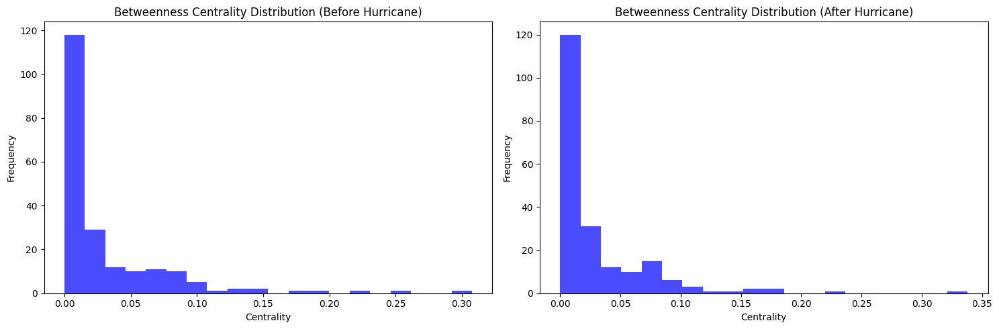

In [395]:
# Extract centrality values (for plotting)
before_centrality_values = list(before_centrality.values())
after_centrality_values = list(after_centrality.values())

# create subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5)) 

# histogram for "pre-hurricane"
axes[0].hist(before_centrality_values, bins=20, color='blue', alpha=0.7)
axes[0].set_title("Betweenness Centrality Distribution (Before Hurricane)")
axes[0].set_xlabel("Centrality")
axes[0].set_ylabel("Frequency")

# histogram for "post-hurricane"
axes[1].hist(after_centrality_values, bins=20, color='blue', alpha=0.7)
axes[1].set_title("Betweenness Centrality Distribution (After Hurricane)")
axes[1].set_xlabel("Centrality")
axes[1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

## Tables with absolute and relative changes
Conclusion from the output: no differences identified yet

In [396]:
# add centrality values into a DataFrame
centrality_df = pd.DataFrame({
    'Node': list(before_centrality.keys()),
    'Before_Centrality': list(before_centrality.values()),
    'After_Centrality': list(after_centrality.values())
})

# calculate absolute and relative differences
centrality_df['Absolute_Difference'] = abs(centrality_df['After_Centrality'] - centrality_df['Before_Centrality'])
centrality_df['Relative_Change (%)'] = (centrality_df['Absolute_Difference'] / centrality_df['Before_Centrality']) * 100
centrality_df = centrality_df.fillna(0) 

# print top n nodes with absolute changes
print("Top 10 Nodes with Largest Absolute Change in Betweenness Centrality:")
print(centrality_df.sort_values(by='Absolute_Difference', ascending=False).head(10))

# print overall summary statistics
print("\nSummary Statistics:")
print(centrality_df.describe())

Top 10 Nodes with Largest Absolute Change in Betweenness Centrality:
                   Node  Before_Centrality  After_Centrality  \
30      Georgia_Clayton           0.307677          0.175396   
43       Georgia_DeKalb           0.221868          0.337897   
79   Georgia_Jeff Davis           0.081812          0.049696   
52      Georgia_Emanuel           0.259297          0.234618   
80    Georgia_Jefferson           0.094852          0.070414   
44        Georgia_Dodge           0.045687          0.069883   
9       Georgia_Berrien           0.052811          0.029883   
16        Georgia_Burke           0.139392          0.161101   
66     Georgia_Gwinnett           0.185297          0.164192   
137      Georgia_Toombs           0.080701          0.061093   

     Absolute_Difference  Relative_Change (%)  
30              0.132280            42.993368  
43              0.116029            52.296474  
79              0.032116            39.256198  
52              0.024679          

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


## Betweenness Centrality Heatmap
Conclusion: no differences observed

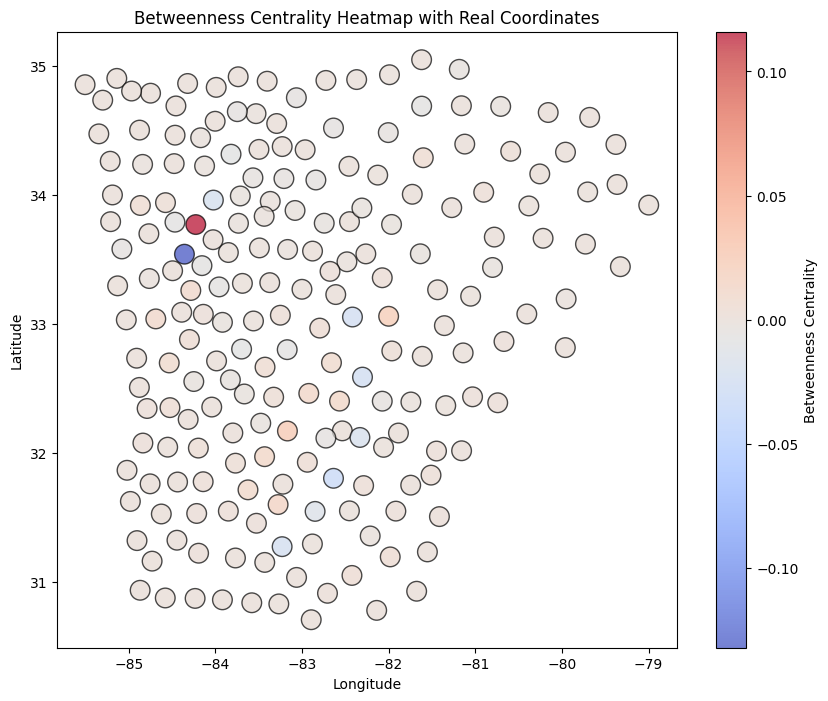

In [397]:
# create a dataframe
regions = pd.DataFrame(node_data)
# print(regions.head())

positions = {row['node_id']: (row['x'], row['y']) for _, row in regions.iterrows()} # get positions for NetworkX graph visualization
centrality_diff = {node: after_centrality[node] - before_centrality[node] for node in before_centrality}

x = [positions[node][0] for node in regions['node_id']]
y = [positions[node][1] for node in regions['node_id']]
centrality_changes = [centrality_diff[node] for node in regions['node_id']]

# heatmap
plt.figure(figsize=(10, 8))
plt.scatter(x, y, c=centrality_changes, cmap='coolwarm', s=200, edgecolor='k', alpha=0.7)
plt.colorbar(label='Betweenness Centrality')
plt.title("Betweenness Centrality Heatmap with Real Coordinates")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

## Top nodes in the graphs

### Before Hurricane

Top 10 nodes by betweenness centrality (before hurricane):
                  node_id  centrality
30        Georgia_Clayton    0.307677
52        Georgia_Emanuel    0.259297
43         Georgia_DeKalb    0.221868
66       Georgia_Gwinnett    0.185297
86        Georgia_Laurens    0.169902
160  South Carolina_Aiken    0.149425
16          Georgia_Burke    0.139392
10           Georgia_Bibb    0.126437
59         Georgia_Fulton    0.126087
68           Georgia_Hall    0.115884


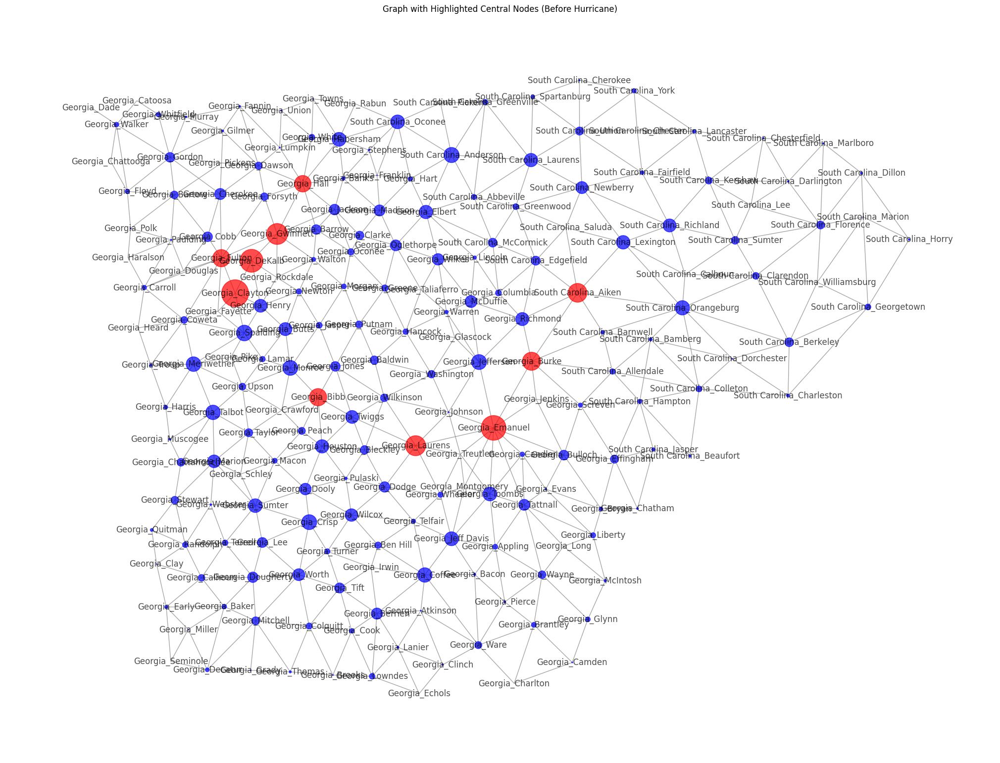

In [398]:
node_df = pd.DataFrame(node_data)

centrality_df = pd.DataFrame([
    {'node_id': node, 'centrality': centrality}
    for node, centrality in before_centrality.items()
])

# centrality and coordinate data -> combine! 
merged_data = pd.merge(node_df, centrality_df, on='node_id')
merged_data = merged_data.sort_values(by='centrality', ascending=False)

# top nodes printed
top_central_nodes = merged_data.head(10)
print("Top 10 nodes by betweenness centrality (before hurricane):")
print(top_central_nodes[['node_id', 'centrality']])

# info for visualization
pos = {row['node_id']: (row['x'], row['y']) for _, row in merged_data.iterrows()} # get positions
top_nodes = set(top_central_nodes['node_id'])
node_color = ['red' if node in top_nodes else 'blue' for node in nx_ntl.nodes()] # red if top node, else node is blue
node_size = [5000 * before_centrality[node] for node in nx_ntl.nodes()]

# plotting
plt.figure(figsize=(20, 15))
nx.draw(
    nx_ntl, positions,
    with_labels=True,
    node_size=node_size,
    node_color=node_color,
    edge_color="gray",
    alpha=0.7,
)
plt.title("Graph with Highlighted Central Nodes (Before Hurricane)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

### After Hurricane

Top 10 nodes by betweenness centrality (after hurricane):
                  node_id  centrality
43         Georgia_DeKalb    0.337897
52        Georgia_Emanuel    0.234618
86        Georgia_Laurens    0.181578
30        Georgia_Clayton    0.175396
66       Georgia_Gwinnett    0.164192
16          Georgia_Burke    0.161101
160  South Carolina_Aiken    0.146491
59         Georgia_Fulton    0.118854
10           Georgia_Bibb    0.117780
125      Georgia_Spalding    0.113614


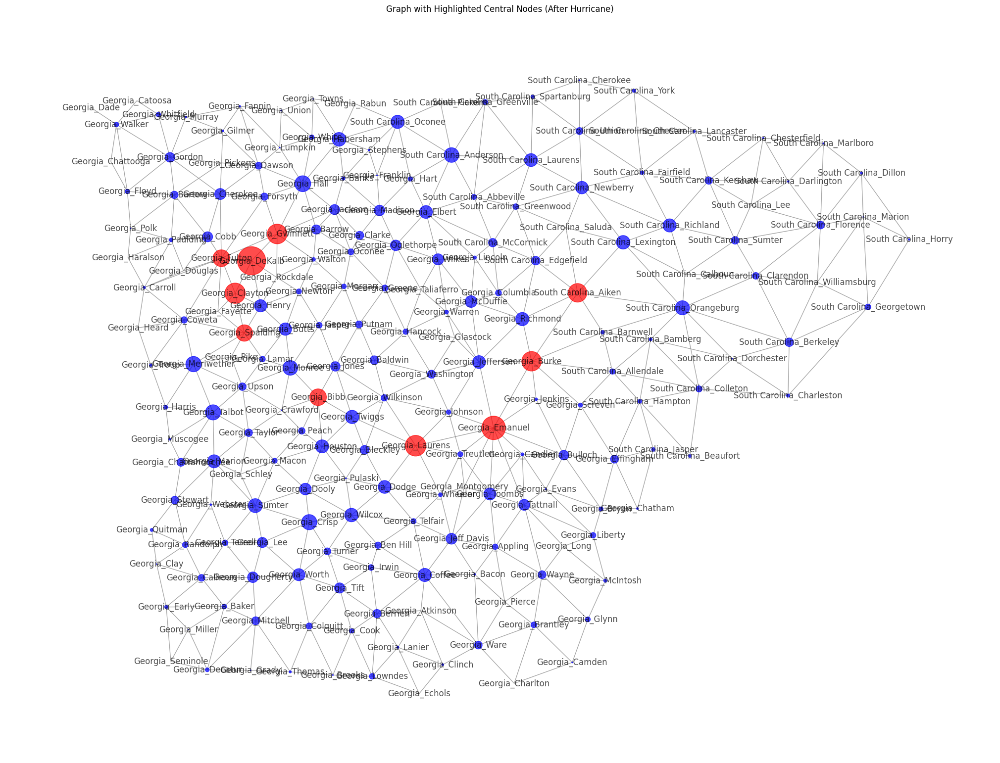

In [399]:
node_df = pd.DataFrame(node_data)

centrality_df = pd.DataFrame([
    {'node_id': node, 'centrality': centrality}
    for node, centrality in after_centrality.items()
])

# centrality and coordinate data -> combine! 
merged_data = pd.merge(node_df, centrality_df, on='node_id')
merged_data = merged_data.sort_values(by='centrality', ascending=False)

# top nodes printed
top_central_nodes = merged_data.head(10)
print("Top 10 nodes by betweenness centrality (after hurricane):")
print(top_central_nodes[['node_id', 'centrality']])

# info for visualization
pos = {row['node_id']: (row['x'], row['y']) for _, row in merged_data.iterrows()} # get positions
top_nodes = set(top_central_nodes['node_id'])
node_color = ['red' if node in top_nodes else 'blue' for node in nx_ntl.nodes()] # red if top node, else node is blue
node_size = [5000 * after_centrality[node] for node in nx_ntl.nodes()]

# plotting
plt.figure(figsize=(20, 15))
nx.draw(
    nx_ntl, positions,
    with_labels=True,
    node_size=node_size,
    node_color=node_color,
    edge_color="gray",
    alpha=0.7,
)
plt.title("Graph with Highlighted Central Nodes (After Hurricane)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

Code that generates the same graphs vertically for better comparison

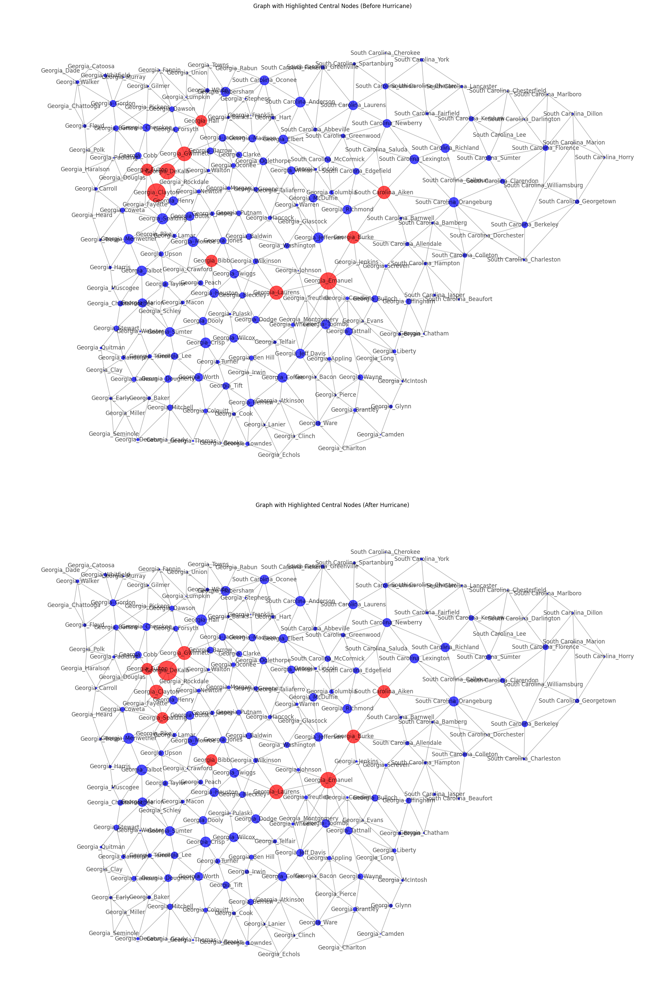

In [400]:
# pre-hurricane
node_df = pd.DataFrame(node_data)
centrality_df_before = pd.DataFrame([
    {'node_id': node, 'centrality': centrality}
    for node, centrality in before_centrality.items()
])
merged_data_before = pd.merge(node_df, centrality_df_before, on='node_id')
merged_data_before = merged_data_before.sort_values(by='centrality', ascending=False)
top_central_nodes_before = merged_data_before.head(10)
pos_before = {row['node_id']: (row['x'], row['y']) for _, row in merged_data_before.iterrows()}
top_nodes_before = set(top_central_nodes_before['node_id'])
node_color_before = ['red' if node in top_nodes_before else 'blue' for node in nx_ntl.nodes()]
node_size_before = [5000 * before_centrality[node] for node in nx_ntl.nodes()]

# post-hurricane"
centrality_df_after = pd.DataFrame([
    {'node_id': node, 'centrality': centrality}
    for node, centrality in after_centrality.items()
])
merged_data_after = pd.merge(node_df, centrality_df_after, on='node_id')
merged_data_after = merged_data_after.sort_values(by='centrality', ascending=False)
top_central_nodes_after = merged_data_after.head(10)
pos_after = {row['node_id']: (row['x'], row['y']) for _, row in merged_data_after.iterrows()}
top_nodes_after = set(top_central_nodes_after['node_id'])
node_color_after = ['red' if node in top_nodes_after else 'blue' for node in nx_ntl.nodes()]
node_size_after = [5000 * after_centrality[node] for node in nx_ntl.nodes()]


# subplots
fig, axes = plt.subplots(2, 1, figsize=(20, 30))

# generate pre-hurricane plot
nx.draw(
    nx_ntl, pos_before,
    with_labels=True,
    node_size=node_size_before,
    node_color=node_color_before,
    edge_color="gray",
    alpha=0.7,
    ax=axes[0]
)
axes[0].set_title("Graph with Highlighted Central Nodes (Before Hurricane)")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")

# generate post-hurricane plot
nx.draw(
    nx_ntl, pos_after,
    with_labels=True,
    node_size=node_size_after,
    node_color=node_color_after,
    edge_color="gray",
    alpha=0.7,
    ax=axes[1]
)
axes[1].set_title("Graph with Highlighted Central Nodes (After Hurricane)")
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")

# Display plots
plt.tight_layout()
plt.show()


## Community Detection

In [417]:
communities = list(greedy_modularity_communities(nx_ntl)) # modularity-based clustering

print("\nDetected Communities:")
for i, community in enumerate(communities):
    print(f"Community {i + 1}: {list(community)}")


Detected Communities:
Community 1: ['Georgia_Spalding', 'Georgia_Oglethorpe', 'Georgia_Jones', 'Georgia_Jackson', 'Georgia_Fannin', 'Georgia_Gwinnett', 'Georgia_Towns', 'Georgia_Clayton', 'Georgia_Lumpkin', 'Georgia_Jasper', 'Georgia_Troup', 'Georgia_Heard', 'Georgia_Walton', 'Georgia_Carroll', 'Georgia_Oconee', 'Georgia_Newton', 'Georgia_Murray', 'Georgia_Monroe', 'Georgia_Morgan', 'Georgia_DeKalb', 'Georgia_Forsyth', 'Georgia_Habersham', 'Georgia_Floyd', 'Georgia_Butts', 'Georgia_Haralson', 'Georgia_Polk', 'Georgia_Rabun', 'Georgia_Fayette', 'Georgia_Upson', 'Georgia_Chattooga', 'Georgia_Paulding', 'Georgia_Coweta', 'Georgia_Lamar', 'Georgia_Gilmer', 'Georgia_Greene', 'Georgia_Rockdale', 'Georgia_Harris', 'Georgia_Henry', 'Georgia_White', 'Georgia_Gordon', 'Georgia_Fulton', 'Georgia_Pike', 'Georgia_Whitfield', 'Georgia_Meriwether', 'Georgia_Hall', 'Georgia_Dade', 'Georgia_Douglas', 'Georgia_Clarke', 'Georgia_Pickens', 'Georgia_Banks', 'Georgia_Bartow', 'Georgia_Catoosa', 'Georgia_Pu

#### Unweighted Community Detection with Greedy Modularity

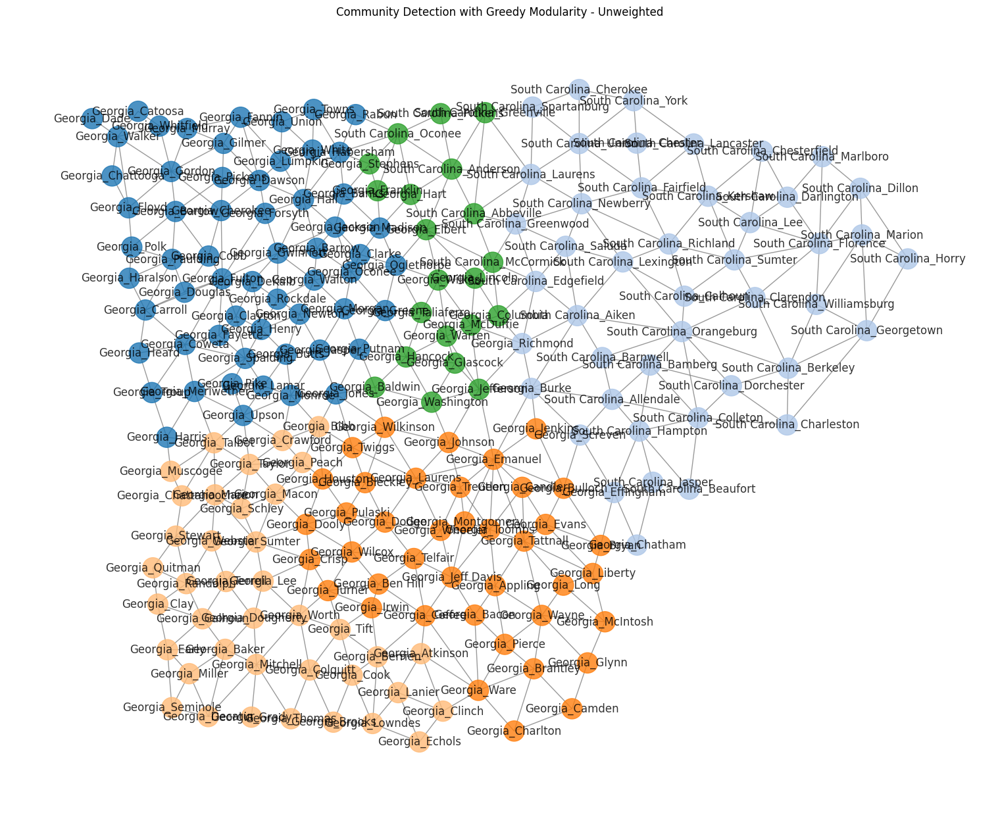

In [418]:
community_colors = itertools.cycle(plt.cm.tab20.colors) # color map
community_map = {node: i for i, community in enumerate(communities) for node in community}

# node color mapping based on communities
node_color = [community_colors.__next__() for _ in range(len(communities))]
node_colors = [node_color[community_map[node]] for node in nx_ntl.nodes()]

pos = {node['node_id']: (node['x'], node['y']) for node in node_data} # (0, 0) if position is missing

# visualization
plt.figure(figsize=(15, 12))
nx.draw(
    nx_ntl, pos,
    with_labels=True,
    node_color=node_colors,
    node_size=500,
    edge_color="gray",
    alpha=0.8
)
plt.title("Community Detection with Greedy Modularity - Unweighted")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


#### Weighted Community Detection with Greedy Modularity
5 communities as well
(32 communities detected when incorporating weights - to ignore)


Detected Communities (based on original graph):
Community 1: ['South Carolina_Pickens', 'Georgia_Oglethorpe', 'South Carolina_Anderson', 'Georgia_Franklin', 'South Carolina_Spartanburg', 'Georgia_Jackson', 'Georgia_Gwinnett', 'Georgia_Fannin', 'Georgia_Stephens', 'Georgia_Towns', 'Georgia_Lumpkin', 'Georgia_Elbert', 'Georgia_Carroll', 'Georgia_Walton', 'South Carolina_Laurens', 'Georgia_Oconee', 'Georgia_Murray', 'Georgia_Hart', 'Georgia_Forsyth', 'Georgia_Habersham', 'Georgia_Floyd', 'Georgia_Haralson', 'Georgia_Polk', 'Georgia_Rabun', 'South Carolina_Greenville', 'Georgia_Chattooga', 'Georgia_Paulding', 'Georgia_Gilmer', 'South Carolina_Oconee', 'Georgia_White', 'Georgia_Gordon', 'Georgia_Fulton', 'Georgia_Whitfield', 'Georgia_Dade', 'Georgia_Hall', 'Georgia_Douglas', 'Georgia_Pickens', 'Georgia_Clarke', 'Georgia_Banks', 'Georgia_Bartow', 'Georgia_Catoosa', 'Georgia_Walker', 'Georgia_Madison', 'Georgia_Cobb', 'South Carolina_Abbeville', 'Georgia_Barrow', 'Georgia_Dawson', 'Georgia_C

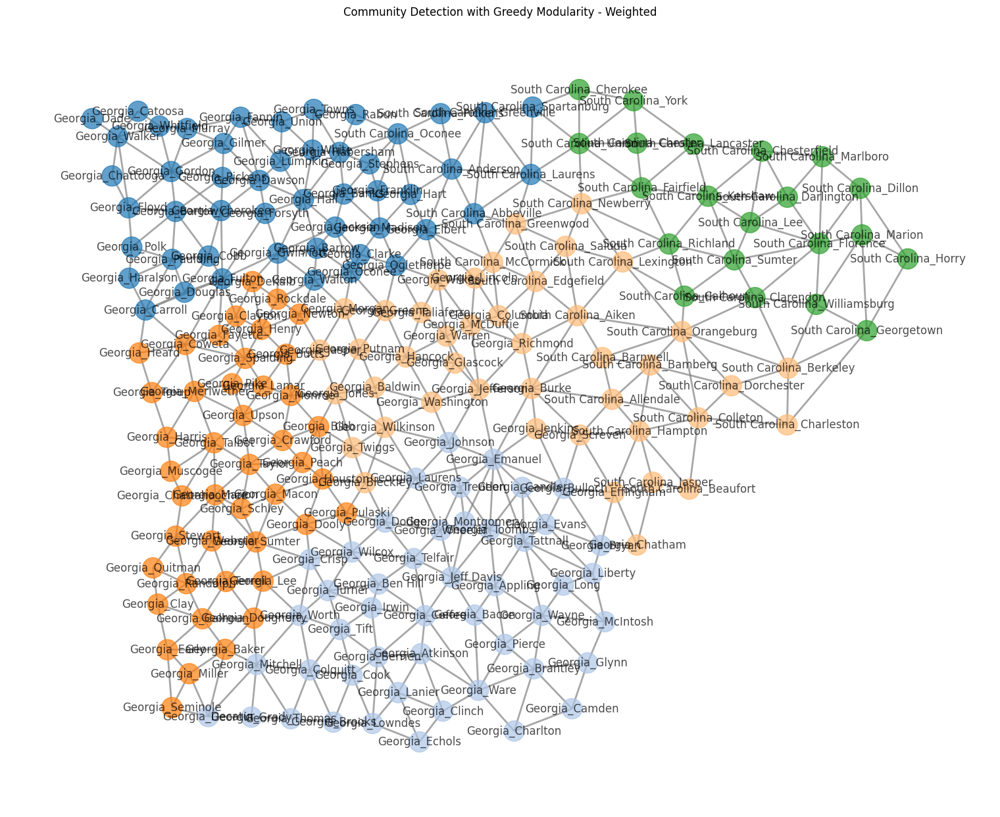

In [415]:
pos = {node['node_id']: (node['x'], node['y']) for node in node_data}  # (0, 0) if coordinates missing

communities = list(greedy_modularity_communities(nx_ntl, weight='weight'))  # communities
print("\nDetected Communities (based on original graph):") # print them
for i, community in enumerate(communities):
    print(f"Community {i + 1}: {list(community)}")

community_colors = itertools.cycle(plt.cm.tab20.colors)  # colormap definition
community_map = {node: i for i, community in enumerate(communities) for node in community}

node_color = [community_colors.__next__() for _ in range(len(communities))]
node_colors = [node_color[community_map[node]] for node in nx_ntl.nodes()]

# sisualization
plt.figure(figsize=(15, 12))
nx.draw(
    nx_ntl, 
    pos=pos, 
    with_labels=True,
    node_color=node_colors,
    node_size=500,
    edge_color="gray",  # edges are gray by default, otherwise too much colors
    alpha=0.7,
    width=2
)

plt.title("Community Detection with Greedy Modularity - Weighted")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

create subplots (easier for report)



Detected Communities (based on weighted graph):
Community 1: ['South Carolina_Pickens', 'Georgia_Oglethorpe', 'South Carolina_Anderson', 'Georgia_Franklin', 'South Carolina_Spartanburg', 'Georgia_Jackson', 'Georgia_Gwinnett', 'Georgia_Fannin', 'Georgia_Stephens', 'Georgia_Towns', 'Georgia_Lumpkin', 'Georgia_Elbert', 'Georgia_Carroll', 'Georgia_Walton', 'South Carolina_Laurens', 'Georgia_Oconee', 'Georgia_Murray', 'Georgia_Hart', 'Georgia_Forsyth', 'Georgia_Habersham', 'Georgia_Floyd', 'Georgia_Haralson', 'Georgia_Polk', 'Georgia_Rabun', 'South Carolina_Greenville', 'Georgia_Chattooga', 'Georgia_Paulding', 'Georgia_Gilmer', 'South Carolina_Oconee', 'Georgia_White', 'Georgia_Gordon', 'Georgia_Fulton', 'Georgia_Whitfield', 'Georgia_Dade', 'Georgia_Hall', 'Georgia_Douglas', 'Georgia_Pickens', 'Georgia_Clarke', 'Georgia_Banks', 'Georgia_Bartow', 'Georgia_Catoosa', 'Georgia_Walker', 'Georgia_Madison', 'Georgia_Cobb', 'South Carolina_Abbeville', 'Georgia_Barrow', 'Georgia_Dawson', 'Georgia_C

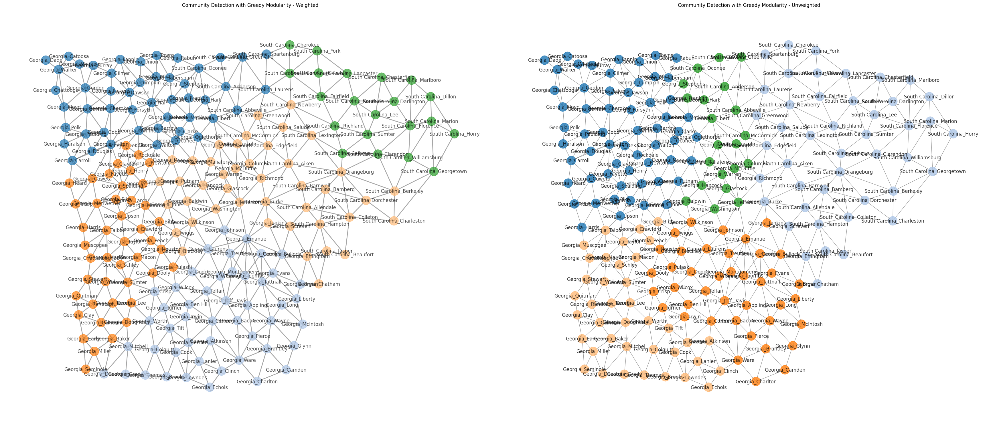

In [426]:
# subplots
fig, axes = plt.subplots(1, 2, figsize=(35, 15))  # 1 row, 2 columns

# weighted-plot
weighted_communities = list(greedy_modularity_communities(nx_ntl, weight='weight'))  # communities
print("\nDetected Communities (based on weighted graph):")  # print them
for i, community in enumerate(weighted_communities):
    print(f"Community {i + 1}: {list(community)}")

community_colors = itertools.cycle(plt.cm.tab20.colors)  # colormap definition
community_map = {node: i for i, community in enumerate(weighted_communities) for node in community}

node_color = [community_colors.__next__() for _ in range(len(weighted_communities))]
node_colors = [node_color[community_map[node]] for node in nx_ntl.nodes()]

axes[0].set_title("Community Detection with Greedy Modularity - Weighted")
nx.draw(
    nx_ntl, 
    pos=pos, 
    with_labels=True,
    node_color=node_colors,
    node_size=500,
    edge_color="gray",  # edges are gray by default, otherwise too much colors
    alpha=0.7,
    width=2,
    ax=axes[0]  # Draw on the first subplot
)
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")

# unweighted-plot
unweighted_communities = list(greedy_modularity_communities(nx_ntl, weight=None))  # communities
print("\nDetected Communities (based on unweighted graph):")  # print them
for i, community in enumerate(unweighted_communities):
    print(f"Community {i + 1}: {list(community)}")

community_colors = itertools.cycle(plt.cm.tab20.colors)  # colormap definition
community_map = {node: i for i, community in enumerate(unweighted_communities) for node in community}

node_color = [community_colors.__next__() for _ in range(len(unweighted_communities))]
node_colors = [node_color[community_map[node]] for node in nx_ntl.nodes()]

axes[1].set_title("Community Detection with Greedy Modularity - Unweighted")
nx.draw(
    nx_ntl, 
    pos=pos,
    with_labels=True,
    node_color=node_colors,
    node_size=500,
    edge_color="gray",
    alpha=0.8,
    ax=axes[1] 
)
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")

plt.tight_layout()
plt.show()



Detected Communities (based on weighted graph):
Community 1: ['South Carolina_Pickens', 'Georgia_Oglethorpe', 'South Carolina_Anderson', 'Georgia_Franklin', 'South Carolina_Spartanburg', 'Georgia_Jackson', 'Georgia_Gwinnett', 'Georgia_Fannin', 'Georgia_Stephens', 'Georgia_Towns', 'Georgia_Lumpkin', 'Georgia_Elbert', 'Georgia_Carroll', 'Georgia_Walton', 'South Carolina_Laurens', 'Georgia_Oconee', 'Georgia_Murray', 'Georgia_Hart', 'Georgia_Forsyth', 'Georgia_Habersham', 'Georgia_Floyd', 'Georgia_Haralson', 'Georgia_Polk', 'Georgia_Rabun', 'South Carolina_Greenville', 'Georgia_Chattooga', 'Georgia_Paulding', 'Georgia_Gilmer', 'South Carolina_Oconee', 'Georgia_White', 'Georgia_Gordon', 'Georgia_Fulton', 'Georgia_Whitfield', 'Georgia_Dade', 'Georgia_Hall', 'Georgia_Douglas', 'Georgia_Pickens', 'Georgia_Clarke', 'Georgia_Banks', 'Georgia_Bartow', 'Georgia_Catoosa', 'Georgia_Walker', 'Georgia_Madison', 'Georgia_Cobb', 'South Carolina_Abbeville', 'Georgia_Barrow', 'Georgia_Dawson', 'Georgia_C

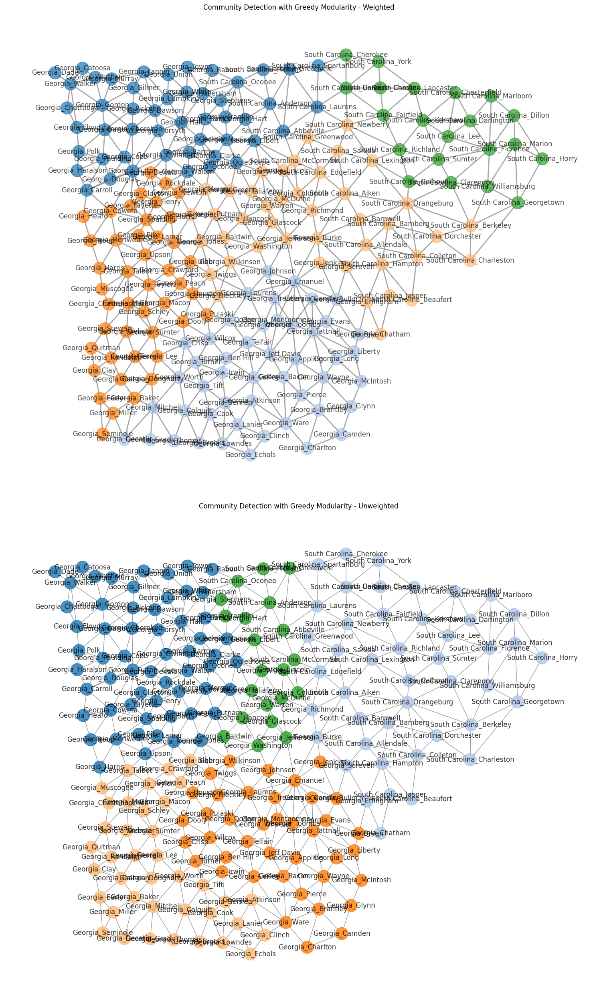

In [430]:
fig, axes = plt.subplots(2, 1, figsize=(15, 25))  # 2 rows, 1 column (vertically arranged)

# weighted-plot
weighted_communities = list(greedy_modularity_communities(nx_ntl, weight='weight'))  # communities
print("\nDetected Communities (based on weighted graph):")  # print them
for i, community in enumerate(weighted_communities):
    print(f"Community {i + 1}: {list(community)}")

community_colors = itertools.cycle(plt.cm.tab20.colors)  # colormap definition
community_map = {node: i for i, community in enumerate(weighted_communities) for node in community}

node_color = [community_colors.__next__() for _ in range(len(weighted_communities))]
node_colors = [node_color[community_map[node]] for node in nx_ntl.nodes()]

axes[0].set_title("Community Detection with Greedy Modularity - Weighted")
nx.draw(
    nx_ntl, 
    pos=pos, 
    with_labels=True,
    node_color=node_colors,
    node_size=500,
    edge_color="gray",  # edges are gray by default, otherwise too much colors
    alpha=0.7,
    width=2,
    ax=axes[0]  
)
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")

# unweighted-plot
unweighted_communities = list(greedy_modularity_communities(nx_ntl, weight=None))  # communities
print("\nDetected Communities (based on unweighted graph):")  # print them
for i, community in enumerate(unweighted_communities):
    print(f"Community {i + 1}: {list(community)}")

community_colors = itertools.cycle(plt.cm.tab20.colors)  # colormap definition
community_map = {node: i for i, community in enumerate(unweighted_communities) for node in community}

node_color = [community_colors.__next__() for _ in range(len(unweighted_communities))]
node_colors = [node_color[community_map[node]] for node in nx_ntl.nodes()]


axes[1].set_title("Community Detection with Greedy Modularity - Unweighted")
nx.draw(
    nx_ntl, 
    pos=pos,
    with_labels=True,
    node_color=node_colors,
    node_size=500,
    edge_color="gray",
    alpha=0.8,
    ax=axes[1]  
)
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")


plt.tight_layout()
plt.show()


In [416]:
# pos = {node['node_id']: (node['x'], node['y']) for node in node_data}  # (0, 0) if coordinates missing

# # new graph needed with weight differences
# G_diff = nx.Graph()
# for node, position in pos.items():
#     G_diff.add_node(node, pos=position)
# for (u, v), diff in weight_differences.items():
#     G_diff.add_edge(u, v, weight=diff)

# communities = list(greedy_modularity_communities(G_diff, weight='weight')) # communities
# print("\nDetected Communities (based on weight differences):")
# for i, community in enumerate(communities):
#     print(f"Community {i + 1}: {list(community)}")

# # colors assigned to communities
# community_colors = itertools.cycle(plt.cm.tab20.colors)  # colormap definition
# community_map = {node: i for i, community in enumerate(communities) for node in community}

# # Create node color mapping based on community membership
# node_color = [community_colors.__next__() for _ in range(len(communities))]
# node_colors = [node_color[community_map[node]] for node in G_diff.nodes()]

# # plot
# plt.figure(figsize=(15, 12))
# nx.draw(
#     G_diff, 
#     pos=pos, 
#     with_labels=True,
#     node_color=node_colors,
#     node_size=500,
#     edge_color="gray",  # edges are gray by default, otherwise too much colors
#     alpha=0.7,
#     width=2
# )

# # show edges weight differences 
# for (u, v), diff in weight_differences.items():
#     x_u, y_u = pos[u]
#     x_v, y_v = pos[v]
#     x_mid = (x_u + x_v) / 2
#     y_mid = (y_u + y_v) / 2
#     plt.text(x_mid, y_mid, f"{diff:.2f}", fontsize=8, color="darkblue", ha="center", va="center")

# plt.title("Community Detection with Greedy Modularity - Weighted")
# plt.xlabel("Longitude")
# plt.ylabel("Latitude")
# plt.show()


too much going on, hence remove edge information to just have communities visualized

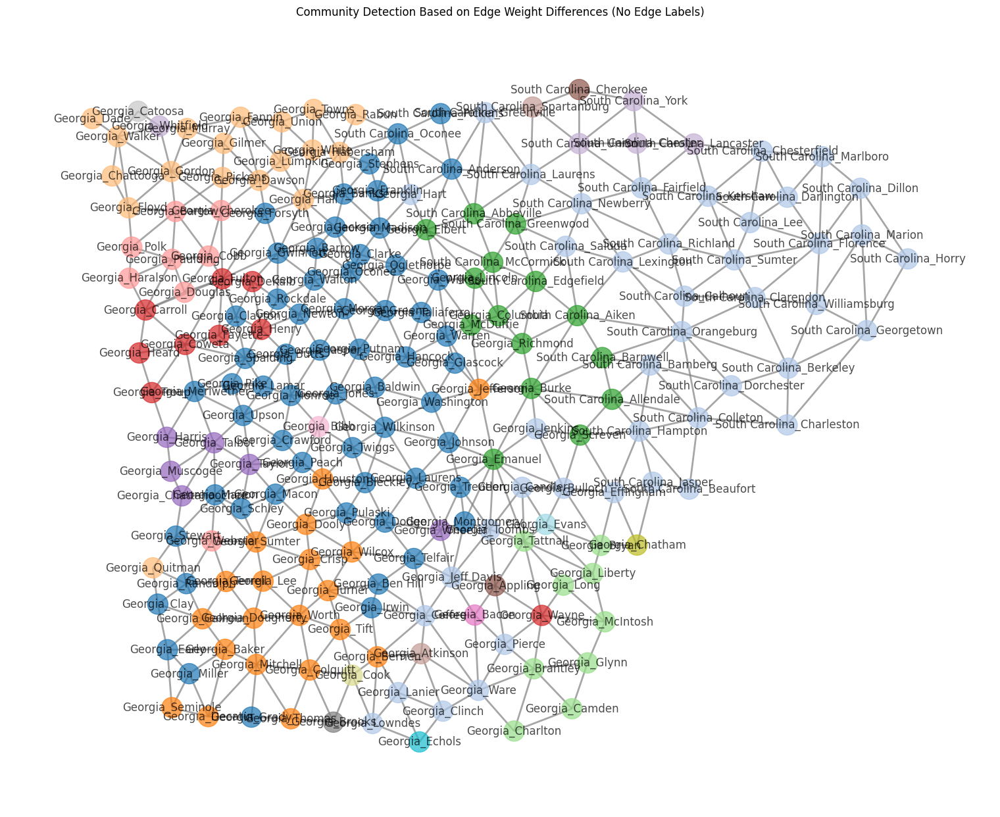

In [404]:
plt.figure(figsize=(15, 12))
nx.draw(
    G_diff, 
    pos=pos,  
    with_labels=True,
    node_color=node_colors,
    node_size=500,
    edge_color="gray",  # Edges will be gray by default
    alpha=0.7,
    width=2
)

plt.title("Community Detection Based on Edge Weight Differences (No Edge Labels)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


## Edge Analysis

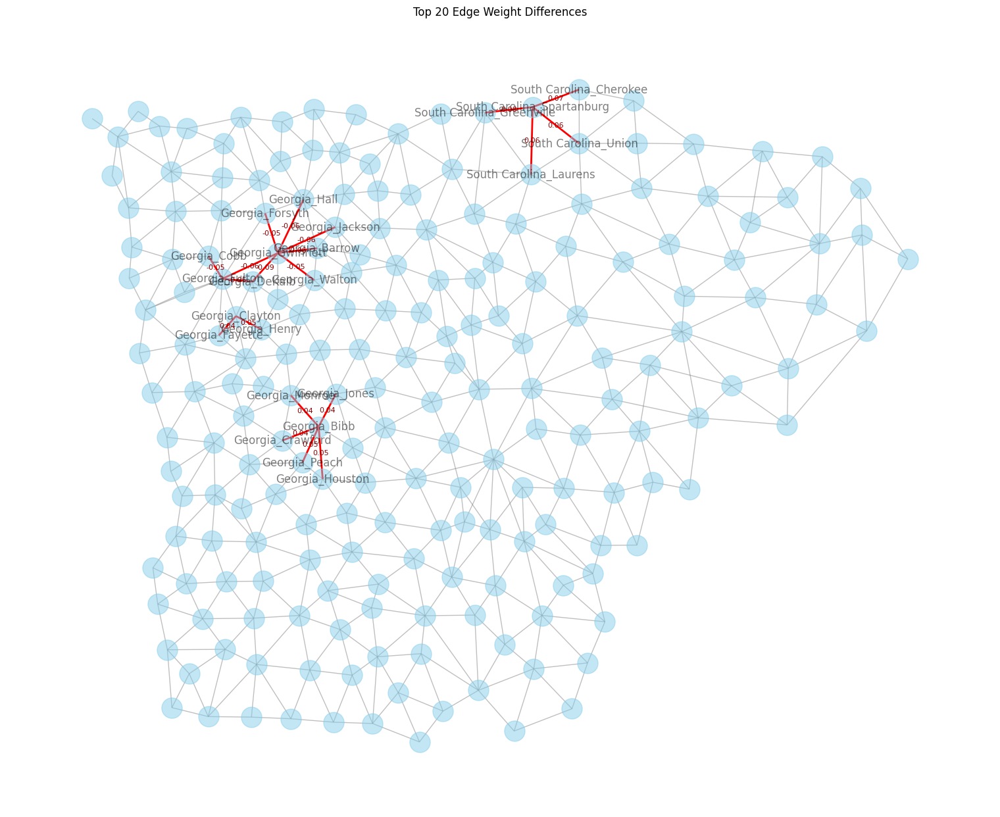

Top Edge Differences:
                        Node 1                      Node 2  Weight Difference
0               Georgia_DeKalb            Georgia_Gwinnett              -0.09
1    South Carolina_Greenville  South Carolina_Spartanburg               0.08
2      South Carolina_Cherokee  South Carolina_Spartanburg               0.07
3   South Carolina_Spartanburg        South Carolina_Union               0.06
4               Georgia_Fulton            Georgia_Gwinnett              -0.06
5             Georgia_Gwinnett             Georgia_Jackson              -0.06
6       South Carolina_Laurens  South Carolina_Spartanburg               0.06
7             Georgia_Gwinnett                Georgia_Hall              -0.06
8               Georgia_DeKalb              Georgia_Fulton              -0.06
9               Georgia_Barrow            Georgia_Gwinnett              -0.06
10                Georgia_Bibb             Georgia_Houston               0.05
11                Georgia_Bibb            

In [405]:
pos = {node['node_id']: (node['x'], node['y']) for node in node_data} # get node positions/ coordinates

# derive weight differences
normalize_weights(nx_ntl, '2024-09-25') 
weights_before = { (u, v): nx_ntl[u][v]['weight'] for u, v in nx_ntl.edges() }
normalize_weights(nx_ntl, '2024-09-30')  # Recalculate for the 'after' date
weights_after = { (u, v): nx_ntl[u][v]['weight'] for u, v in nx_ntl.edges() }

weight_differences = {edge: weights_after[edge] - weights_before[edge] for edge in weights_before}

# top 20 edge differences
top_20_edges = sorted(weight_differences.items(), key=lambda x: abs(x[1]), reverse=True)[:20]

# extract the edges and their corresponding nodes
strongest_edges = [(u, v, round(diff, 2)) for (u, v), diff in top_20_edges]

# node labels for plot
nodes_with_strongest_edges = set()
for u, v, _ in strongest_edges:
    nodes_with_strongest_edges.add(u)
    nodes_with_strongest_edges.add(v)

node_labels = {node: node if node in nodes_with_strongest_edges else "" for node in nx_ntl.nodes()}


# visualization
plt.figure(figsize=(15, 12))

# only highlight the strongest edges
nx.draw(
    nx_ntl, pos,
    with_labels=True,
    labels=node_labels,  # strongest edges; top 20
    node_size=500,
    node_color="skyblue",
    edge_color="gray",
    alpha=0.5
)

# draw top strongest edges with weight differences in red
strongest_edge_set = {(u, v) for u, v, _ in strongest_edges}
nx.draw_networkx_edges(
    nx_ntl, pos,
    edgelist=strongest_edge_set,
    edge_color="red",
    width=2
)

# annoation
for u, v, diff in strongest_edges:
    x_u, y_u = pos[u]  
    x_v, y_v = pos[v] 
    x_mid = (x_u + x_v) / 2  
    y_mid = (y_u + y_v) / 2  
    plt.text(x_mid, y_mid, f"{diff:.2f}", fontsize=8, color="darkred", ha="center", va="center")

plt.title("Top 20 Edge Weight Differences")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


print("Top Edge Differences:")
strongest_edges_df = pd.DataFrame(strongest_edges, columns=['Node 1', 'Node 2', 'Weight Difference'])
print(strongest_edges_df)




## Heatmaps

### Overall Heatmap (all counties)
too big, need to generate top 5

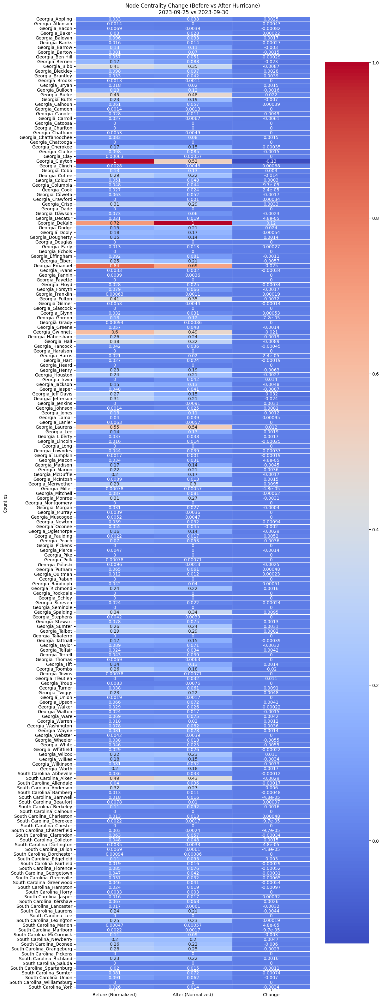

In [406]:
nodes = list(nx_ntl.nodes())
before_values = [before_centrality[node] for node in nodes]
after_values = [after_centrality[node] for node in nodes]

df = pd.DataFrame({
    'Node': nodes,
    f'Before': before_values,
    f'After': after_values,
    'Change': [after_values[i] - before_values[i] for i in range(len(nodes))]
})

# Normalize centralities
df['Before (Normalized)'] = (df[f'Before'] - min(before_values)) / (max(before_values) - min(before_values))
df['After (Normalized)'] = (df[f'After'] - min(after_values)) / (max(after_values) - min(after_values))

# heatmap
heatmap_data = df.set_index('Node') 
plt.figure(figsize=(12, 40))
sns.heatmap(
    heatmap_data[['Before (Normalized)', 'After (Normalized)', 'Change']],
    annot=True, cmap='coolwarm', linewidths=0.5
)

plt.title(f"Node Centrality Change (Before vs After Hurricane)\n 2023-09-25 vs 2023-09-30")
plt.ylabel("Counties")
plt.show()


### Top 5 nodes

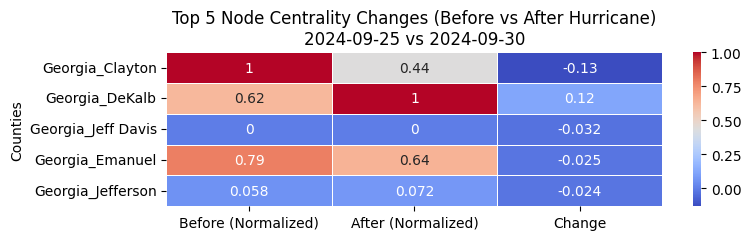

In [407]:
# Calculate changes and filter top nodes
centrality_change = {node: after_centrality[node] - before_centrality[node] for node in nx_ntl.nodes()}
top_nodes = sorted(centrality_change.keys(), key=lambda x: abs(centrality_change[x]), reverse=True)[:5]

 # Prepare data for heatmap
df = pd.DataFrame({
    'Node': top_nodes,
    f'Before': [before_centrality[node] for node in top_nodes],
    f'After': [after_centrality[node] for node in top_nodes],
    'Change': [centrality_change[node] for node in top_nodes]
})

# Normalize centrality values for better heatmap contrast
df['Before (Normalized)'] = (df[f'Before'] - df[f'Before'].min()) / (
            df[f'Before'].max() - df[f'Before'].min())
df['After (Normalized)'] = (df[f'After'] - df[f'After'].min()) / (
            df[f'After'].max() - df[f'After'].min())

# Plot heatmap
plt.figure(figsize=(8, 2))
sns.heatmap(
    df.set_index('Node')[['Before (Normalized)', 'After (Normalized)', 'Change']],
    annot=True, cmap='coolwarm', linewidths=0.5
)
plt.title(f"Top 5 Node Centrality Changes (Before vs After Hurricane)\n2024-09-25 vs 2024-09-30")
plt.ylabel("Counties")
plt.show()

### Community-Level Visualization
Take the 5 generated communities from before for visualization


Detected Communities:
Community 1: ['South Carolina_Pickens', 'Georgia_Oglethorpe', 'South Carolina_Anderson', 'Georgia_Franklin', 'South Carolina_Spartanburg', 'Georgia_Jackson', 'Georgia_Gwinnett', 'Georgia_Fannin', 'Georgia_Stephens', 'Georgia_Towns', 'Georgia_Lumpkin', 'Georgia_Elbert', 'Georgia_Carroll', 'Georgia_Walton', 'South Carolina_Laurens', 'Georgia_Oconee', 'Georgia_Murray', 'Georgia_Hart', 'Georgia_Forsyth', 'Georgia_Habersham', 'Georgia_Floyd', 'Georgia_Haralson', 'Georgia_Polk', 'Georgia_Rabun', 'South Carolina_Greenville', 'Georgia_Chattooga', 'Georgia_Paulding', 'Georgia_Gilmer', 'South Carolina_Oconee', 'Georgia_White', 'Georgia_Gordon', 'Georgia_Fulton', 'Georgia_Whitfield', 'Georgia_Dade', 'Georgia_Hall', 'Georgia_Douglas', 'Georgia_Pickens', 'Georgia_Clarke', 'Georgia_Banks', 'Georgia_Bartow', 'Georgia_Catoosa', 'Georgia_Walker', 'Georgia_Madison', 'Georgia_Cobb', 'South Carolina_Abbeville', 'Georgia_Barrow', 'Georgia_Dawson', 'Georgia_Cherokee', 'Georgia_Union']

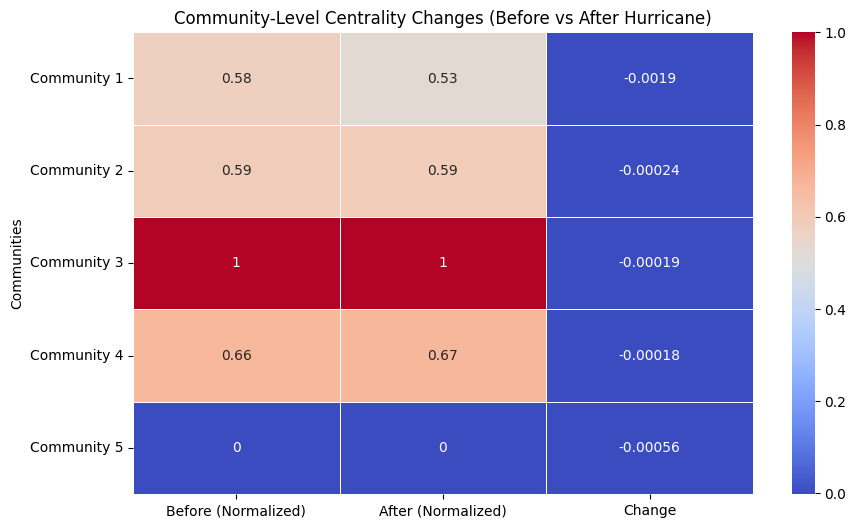

In [408]:
normalize_weights(nx_ntl, '2024-09-25')
before_centrality = nx.betweenness_centrality(nx_ntl, weight='weight')

normalize_weights(nx_ntl, '2024-09-30')
after_centrality = nx.betweenness_centrality(nx_ntl, weight='weight')

# code from before 
communities = list(greedy_modularity_communities(nx_ntl, weight='weight')) # modularity-based clustering

print("\nDetected Communities:")
for i, community in enumerate(communities):
    print(f"Community {i + 1}: {list(community)}")

# aggregate by community for heatmap
community_data = []
for i, community in enumerate(communities):
    community_nodes = list(community)
    avg_before = sum(before_centrality[node] for node in community_nodes) / len(community_nodes)
    avg_after = sum(after_centrality[node] for node in community_nodes) / len(community_nodes)
    community_data.append({
        'Community': f'Community {i + 1}',
        f'Before': avg_before,
        f'After': avg_after,
        'Change': avg_after - avg_before
    })

# DataFrame for heatmap
df = pd.DataFrame(community_data)

# normalize values for visualization
if not df.empty:
    df['Before (Normalized)'] = (df[f'Before'] - df[f'Before'].min()) / \
                                (df[f'Before'].max() - df[f'Before'].min())
    df['After (Normalized)'] = (df[f'After'] - df[f'After'].min()) / \
                                (df[f'After'].max() - df[f'After'].min())

    # heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(
        df.set_index('Community')[['Before (Normalized)', 'After (Normalized)', 'Change']],
        annot=True, cmap='coolwarm', linewidths=0.5
    )
    plt.title(f"Community-Level Centrality Changes (Before vs After Hurricane)")
    plt.ylabel("Communities")
    plt.show()


Detected Communities:
Community 1: ['South Carolina_Pickens', 'Georgia_Oglethorpe', 'South Carolina_Anderson', 'Georgia_Franklin', 'South Carolina_Spartanburg', 'Georgia_Jackson', 'Georgia_Gwinnett', 'Georgia_Fannin', 'Georgia_Stephens', 'Georgia_Towns', 'Georgia_Lumpkin', 'Georgia_Elbert', 'Georgia_Carroll', 'Georgia_Walton', 'South Carolina_Laurens', 'Georgia_Oconee', 'Georgia_Murray', 'Georgia_Hart', 'Georgia_Forsyth', 'Georgia_Habersham', 'Georgia_Floyd', 'Georgia_Haralson', 'Georgia_Polk', 'Georgia_Rabun', 'South Carolina_Greenville', 'Georgia_Chattooga', 'Georgia_Paulding', 'Georgia_Gilmer', 'South Carolina_Oconee', 'Georgia_White', 'Georgia_Gordon', 'Georgia_Fulton', 'Georgia_Whitfield', 'Georgia_Dade', 'Georgia_Hall', 'Georgia_Douglas', 'Georgia_Pickens', 'Georgia_Clarke', 'Georgia_Banks', 'Georgia_Bartow', 'Georgia_Catoosa', 'Georgia_Walker', 'Georgia_Madison', 'Georgia_Cobb', 'South Carolina_Abbeville', 'Georgia_Barrow', 'Georgia_Dawson', 'Georgia_Cherokee', 'Georgia_Union']

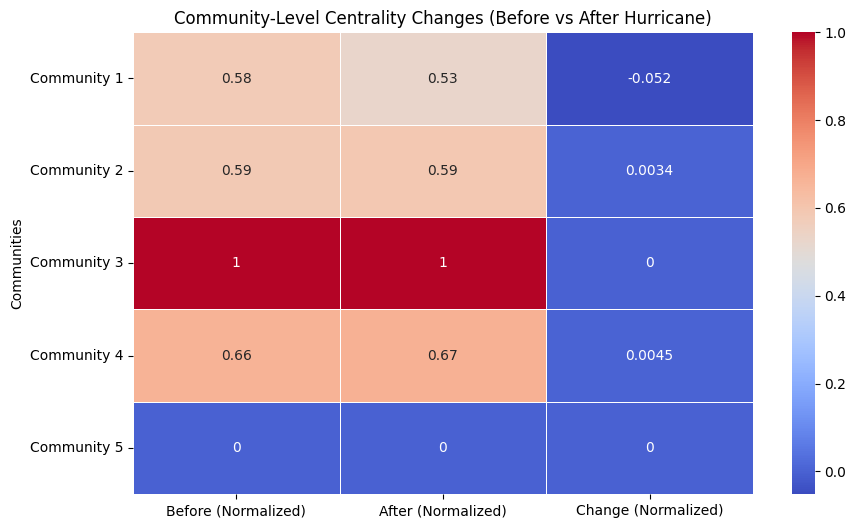

In [409]:
# Community-Level Visualization

# detect communities
communities = list(greedy_modularity_communities(nx_ntl, weight='weight'))

# display community details
print("\nDetected Communities:")
community_overview = []
for i, community in enumerate(communities):
    community_members = list(community)
    print(f"Community {i + 1}: {community_members}")
    community_overview.append({
        'Community': f'Community {i + 1}',
        'Members': community_members
    })

# aggregate by community for heatmap
community_data = []
for i, community in enumerate(communities):
    community_nodes = list(community)
    avg_before = sum(before_centrality[node] for node in community_nodes) / len(community_nodes)
    avg_after = sum(after_centrality[node] for node in community_nodes) / len(community_nodes)
    community_data.append({
        'Community': f'Community {i + 1}',
        f'Before': avg_before,
        f'After': avg_after,
        'Change': avg_after - avg_before
    })


df = pd.DataFrame(community_data)

# normalize values for visualization
if not df.empty:
    df['Before (Normalized)'] = (df[f'Before'] - df[f'Before'].min()) / \
                                (df[f'Before'].max() - df[f'Before'].min())
    df['After (Normalized)'] = (df[f'After'] - df[f'After'].min()) / \
                                (df[f'After'].max() - df[f'After'].min())

    df['Change (Normalized)'] = df['After (Normalized)'] - df['Before (Normalized)']
    
    # heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(
        df.set_index('Community')[['Before (Normalized)', 'After (Normalized)', 'Change (Normalized)']],
        annot=True, cmap='coolwarm', linewidths=0.5
    )
    plt.title(f"Community-Level Centrality Changes (Before vs After Hurricane)")
    plt.ylabel("Communities")
    plt.show()

# df

## Edge Removal
- not added to report (still would need to incorporate coordinates of the nodes)


- Edges are removed by defining two nodes and removing the edge connecting them.


- As no nodes were removed in the graph, node removal was ignored.

Edge between Georgia_Emanuel and Georgia_Jefferson has been removed:)

Impact of Removing Edges [('Georgia_Emanuel', 'Georgia_Jefferson')] on Centrality (2024-09-25):
Georgia_Jefferson: -0.0577
Georgia_Burke: +0.0496
Georgia_McDuffie: -0.0232
Georgia_Wilkes: -0.0217
Georgia_Richmond: +0.0197
Georgia_Johnson: +0.0155
Georgia_Columbia: +0.0140
Georgia_Emanuel: -0.0134
Georgia_Clayton: +0.0096
Georgia_DeKalb: +0.0096


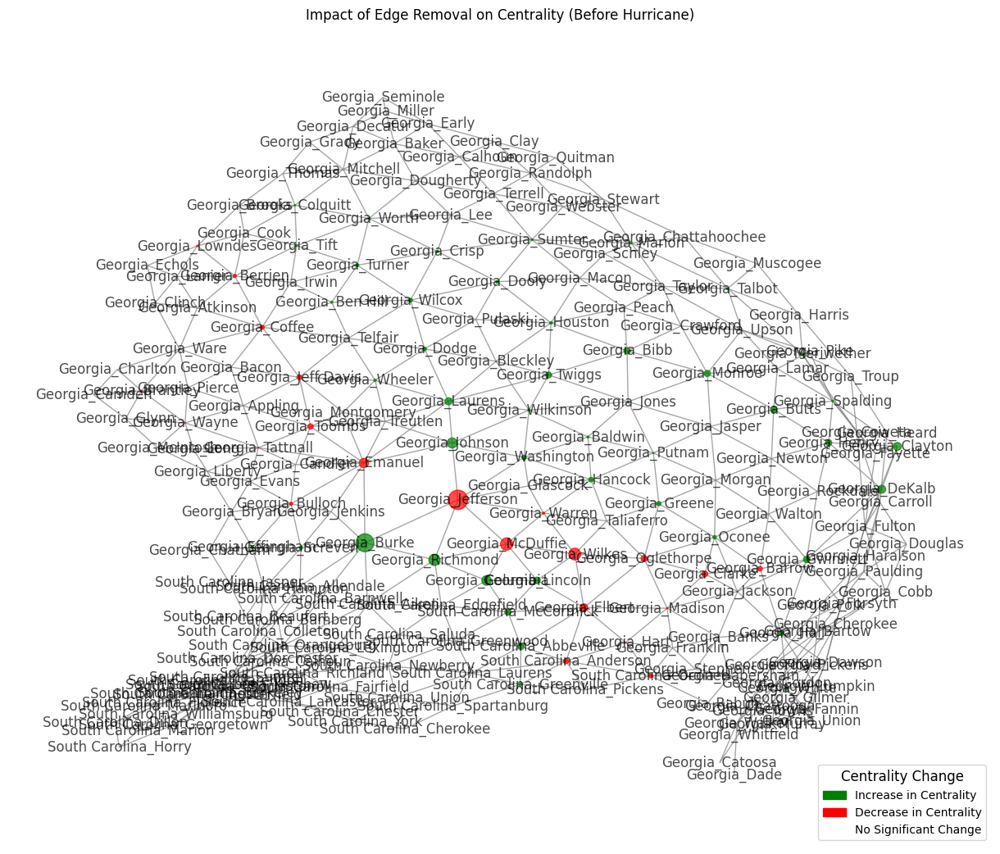

Edge between Georgia_Emanuel and Georgia_Jefferson has been removed:)

Impact of Removing Edges [('Georgia_Emanuel', 'Georgia_Jefferson')] on Centrality (2024-09-30):
Georgia_Jefferson: -0.0335
Georgia_McDuffie: -0.0227
Georgia_Burke: +0.0225
Georgia_Wilkes: -0.0212
Georgia_Richmond: +0.0197
Georgia_Columbia: +0.0140
Georgia_Emanuel: -0.0098
Georgia_Elbert: -0.0086
Georgia_Johnson: +0.0076
Georgia_Lincoln: +0.0065


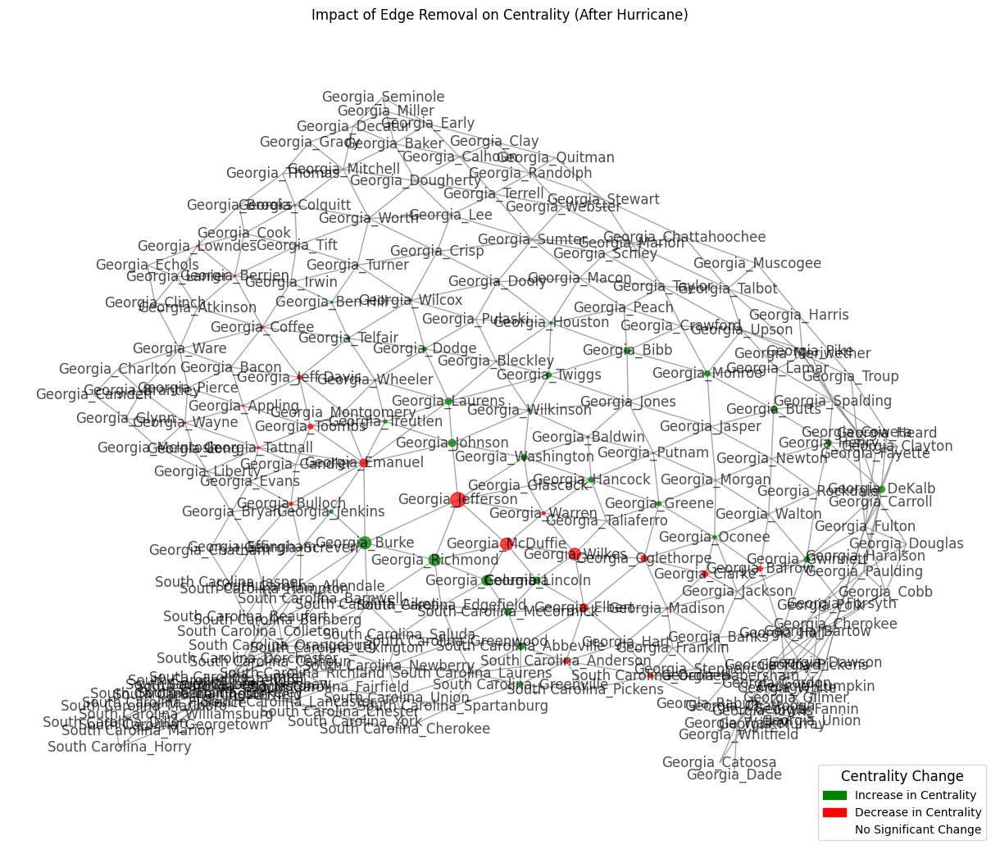

In [410]:
def check_edges_removed(graph, node1, node2): # for verification purposes
    if graph.has_edge(node1, node2):
        print(f"Edge between {node1} and {node2} is still in the graph:(")
    else:
        print(f"Edge between {node1} and {node2} has been removed:)")

def visualize_edge_removal_impact(graph, date_str, edges_to_remove, pos, title_suffix):
    # normalize weights and calculate initial centrality
    normalize_weights(graph, date_str)
    initial_centrality = nx.betweenness_centrality(graph, weight='weight')

    # create a copy of the graph and remove specified edges
    graph_removed = graph.copy()
    
    # remove edges specified in the list
    for (node1, node2) in edges_to_remove:
        graph_removed.remove_edge(node1, node2)
        # Check if the edge is removed
        check_edges_removed(graph_removed, node1, node2)

    # recalculate centrality after edge removal
    simulated_centrality = nx.betweenness_centrality(graph_removed, weight='weight')

    # calculate changes in centrality 
    simulated_change = {
        node: simulated_centrality.get(node, 0) - initial_centrality.get(node, 0)
        for node in graph.nodes()
    }

    # sort and print the top nodes most affected by edge removal
    print(f"\nImpact of Removing Edges {edges_to_remove} on Centrality ({date_str}):")
    for node, change in sorted(simulated_change.items(), key=lambda x: abs(x[1]), reverse=True)[:10]:
        print(f"{node}: {change:+.4f}")

    # colors for changes
    sim_change_color = [
        'green' if simulated_change[node] > 0 else
        'red' if simulated_change[node] < 0 else
        'white'
        for node in graph.nodes()
    ]

    # simulate size-changes on map
    sim_change_size = [abs(simulated_change[node]) * 5000 for node in graph.nodes()]

    plt.figure(figsize=(12, 10))
    nx.draw(
        graph_removed, pos,
        with_labels=True,
        node_size=sim_change_size,
        node_color=sim_change_color,
        edge_color="gray",
        alpha=0.7
    )

    # define legend
    legend_patches = [
        mpatches.Patch(color='green', label='Increase in Centrality'),
        mpatches.Patch(color='red', label='Decrease in Centrality'),
        mpatches.Patch(color='white', label='No Significant Change'),
    ]

    # add legend
    plt.legend(
        handles=legend_patches,
        loc='lower right',
        fontsize=10,
        title='Centrality Change',
        title_fontsize=12
    )

    plt.title(f"Impact of Edge Removal on Centrality ({title_suffix})")
    plt.show()


# edged to be removed are defined throgh the nodes they link
edges_to_remove = [('Georgia_Emanuel', 'Georgia_Jefferson')]

# generating positions for visualization
pos = nx.spring_layout(nx_ntl, seed=42)

# generate graphs
visualize_edge_removal_impact(nx_ntl, '2024-09-25', edges_to_remove, pos, "Before Hurricane")
visualize_edge_removal_impact(nx_ntl, '2024-09-30', edges_to_remove, pos, "After Hurricane")


### Edge Removal Heatmap

Edge between Georgia_Emanuel and Georgia_Jefferson has been removed:)


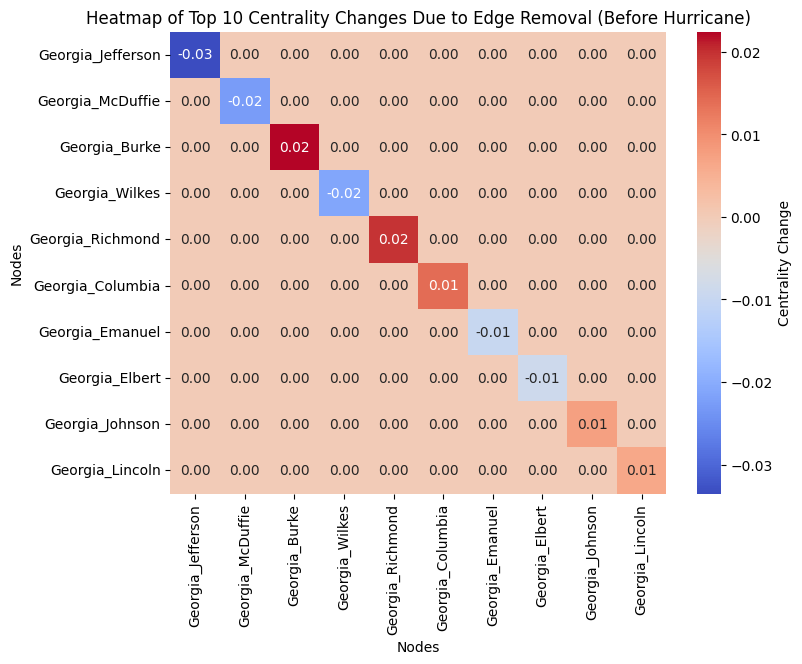

Edge between Georgia_Emanuel and Georgia_Jefferson has been removed:)


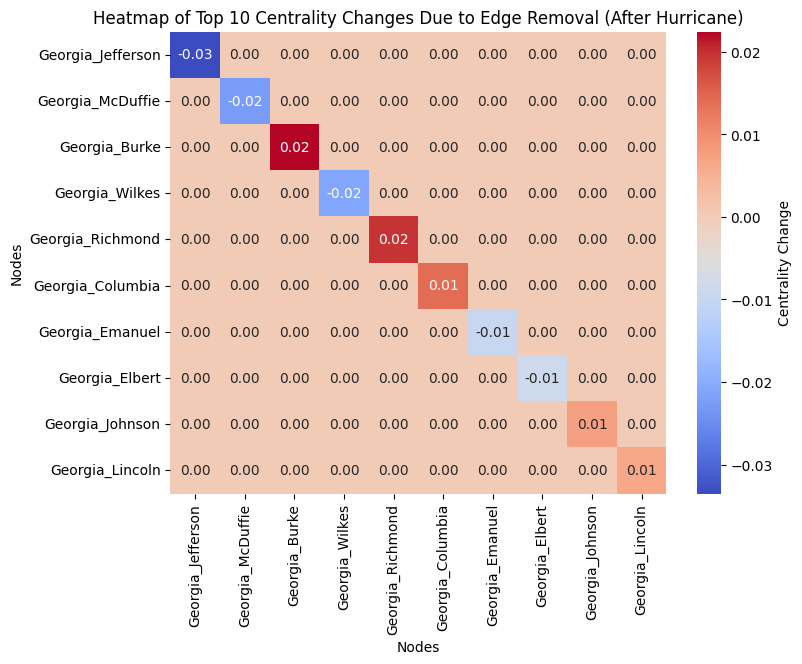

In [411]:
def visualize_edge_removal_impact(graph, date_str, edges_to_remove, title_suffix):
    # normalize weights and calculate initial centrality
    initial_centrality = nx.betweenness_centrality(graph, weight='weight')

    graph_removed = graph.copy()

    for (node1, node2) in edges_to_remove:
        graph_removed.remove_edge(node1, node2)
        check_edges_removed(graph_removed, node1, node2)

    # recalculate centrality after edge removal
    simulated_centrality = nx.betweenness_centrality(graph_removed, weight='weight')

    # changes in centrality calculated
    simulated_change = {
        node: simulated_centrality.get(node, 0) - initial_centrality.get(node, 0)
        for node in graph.nodes()
    }

    # get top N nodes with largest absolute changes
    top_n = 10
    top_changed_nodes = sorted(simulated_change, key=lambda x: abs(simulated_change[x]), reverse=True)[:top_n]
    changes_matrix = np.zeros((len(top_changed_nodes), len(top_changed_nodes)))

    for i, node1 in enumerate(top_changed_nodes):
        for j, node2 in enumerate(top_changed_nodes):
            if node1 == node2:
                changes_matrix[i, j] = simulated_change.get(node1, 0)

    # heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        changes_matrix,
        xticklabels=top_changed_nodes,
        yticklabels=top_changed_nodes,
        cmap="coolwarm",
        annot=True,
        fmt=".2f",
        cbar_kws={'label': 'Centrality Change'}
    )

    plt.title(f"Heatmap of Top {top_n} Centrality Changes Due to Edge Removal ({title_suffix})")
    plt.xlabel("Nodes")
    plt.ylabel("Nodes")
    plt.show()

# edges to remove
edges_to_remove = [('Georgia_Emanuel', 'Georgia_Jefferson')]

# generate graphs
visualize_edge_removal_impact(nx_ntl, '2024-09-25', edges_to_remove, "Before Hurricane")
visualize_edge_removal_impact(nx_ntl, '2024-09-30', edges_to_remove, "After Hurricane")
